# GTEx LORO Tensor Reconstructions

Phase 5 — application of the unified architecture. For each stage in
`('loro_truth', 'loro_recon', 'loro_fused', 'fullfit')` this notebook builds a GTEx
`TensorView` from `out/loro_subject_cache_<policy>/<gene_scope>/<model>/*.npz`,
then renders it jointly with the AHBA harmonized reference so each prediction
stage is visually comparable to the harmonized AHBA target.

Source loaders feed `build_tensor_view_from_cube` exactly as the ComBat
notebook does; the only Phase-5 specific code is `stack_subject_cubes` which
reads the per-subject .npz files.

In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np

from src.eval_utils.eval_style import set_academic_style
from src.eval_utils.eda_core import prepare_pre_post_harmonization_cached
from src.eval_utils.results_eda import EDAConfig
from src.eval_utils.eval_samples import (
    MatchingContext,
    build_combat_tensor_view,
    build_prediction_tensor_view,
    build_joint_tensor_view,
    matching_metadata_compatible,
    plot_gtex_tensor_voxels,
    plot_joint_tensor_voxels,
)

set_academic_style()


In [2]:
SMALL = True

# Cache pointer must match cfg below: cache_root encodes the matching policy.
#   loro_subject_cache_cv → centroids_and_volumes
#   loro_subject_cache_c  → centroids
CACHE_ROOT = 'out/loro_subject_cache_cv'
MODEL_NAME = 'dlam'    # 'naive' | 'dlam' | 'plam'
GENE_SCOPE = 'allgenes'

CSV_PATH = 'data/raw/gxp_samples.csv'   # caches were built against the full CSV
ACTIVE_GENE_LIST = 'richiardi2015'        # post-cube gene-axis filter; None keeps all

MATCHING_POLICY = 'centroids_and_volumes'
MATCHING_POLICY_HEMI_MODE = 'force_left'
GTEX_REP_MODE = 'centroid'
GTEX_HEMI_MODE = 'mirror_left'
COLLAPSE_CEREBELLUM = False
MIN_OBSERVED_PARCELS = 5
COMBAT_USE_COVARIATES = True

# Region axis (same set as combat notebook).
REGION_ORDERING = 'region_matched_superset'

# Subsampling.
N_GTEX_SUBJECTS = 40 if SMALL else 200
N_AHBA_SUBJECTS = 6
N_GENES = 100 if SMALL else None
N_REGIONS = 80 if SMALL else None
RANDOM_SEED = 42

# Pre-filter subject list before loading (avoids stacking the full ~300 npz files).
import random as _random
_random.seed(RANDOM_SEED)
_all_subjects = sorted(p.stem for p in (Path(CACHE_ROOT) / GENE_SCOPE / MODEL_NAME).glob('*.npz'))
if SMALL and N_GTEX_SUBJECTS < len(_all_subjects):
    SUBJECTS_TO_LOAD = sorted(_random.sample(_all_subjects, N_GTEX_SUBJECTS))
else:
    SUBJECTS_TO_LOAD = None
print(f'npz subjects available: {len(_all_subjects)}; loading: '
      f'{len(SUBJECTS_TO_LOAD) if SUBJECTS_TO_LOAD else len(_all_subjects)}')

STACK_ORDER = ('AHBA', 'GTEx')
# Canonical prediction stages: truth, sparse recon (held-out preds),
# dense fused (preds + extrapolation, flagged), full-fit.
STAGES = ('loro_truth', 'loro_recon', 'loro_fused', 'fullfit')
STAGE_TITLES = {
    'loro_truth':  'LORO truth (held-out)',
    'loro_recon':  'LORO recon (held-out predictions)',
    'loro_fused':  'LORO fused (held-out preds + extrapolation)',
    'fullfit':     'Full fit (truth-anchored + extrapolated)',
}

# Render knobs (same as combat notebook for A/B comparability)
MISSING_ALPHA = 1.0
# First pass: no translucency — extrapolated predictions render fully opaque.
# Titrate this < 1.0 later to encode prediction uncertainty.
FUTURE_IMPUTATION_ALPHA = 0.3
MASK_RENDER_MODE = 'two_pass'
FIGSIZE = 'auto'
AXES_BBOX = 'auto'
COLORBAR_BBOX = 'auto'
BOX_ASPECT = 'compressed_data'
BOX_ZOOM = 1
DPI = 300 if SMALL else 400
TITLE_PAD = 0.0
AXIS_ASSIGNMENT = ('gene', 'region', 'subject')
ELEV = 20.0
AZIM = 24.0
SUBJECT_TICK_STEP = 2
GENE_TICK_STEP = 10
REGION_TICK_STEP = 3
TICK_LABEL_PAD = -3.0
SUBJECT_LABEL_MODE = 'full'
GENE_LABEL_MODE = 'full'
SHOW_X_AXIS_LABEL = True
SHOW_Y_AXIS_LABEL = None
SHOW_Z_AXIS_LABEL = None
SHOW_AXIS_LABELS = False
SHOW_SUBJECT_TICKLABELS = True
SHOW_REGION_TICKLABELS = True
SHOW_REGION_LABEL_COLORS = False
SHOW_GENE_TICKLABELS = False
SHOW_AXIS_LINES = True
SHOW_TICK_LINES = True
SHOW_GRID = False
SHOW_LEGEND = True
DATASET_GAP = 1

npz subjects available: 318; loading: 40


## Load PREPOST + MatchingContext

PREPOST gives us the harmonized AHBA reference + the parcel/gene axes used to label the prediction cubes. `MatchingContext` carries the matching dict so the joint compatibility check passes across all four views (`ahba_h`, `loro_truth`, `loro_recon`, `loro_fused`, `fullfit`).

In [3]:
cfg = EDAConfig(
    csv_path=CSV_PATH,
    cache_root=CACHE_ROOT,
    gene_scope=GENE_SCOPE,
    min_observed_parcels=MIN_OBSERVED_PARCELS,
    combat_use_covariates=COMBAT_USE_COVARIATES,
    gtex_rep_mode=GTEX_REP_MODE,
    gtex_hemi_mode=GTEX_HEMI_MODE,
    matching_policy=MATCHING_POLICY,
    matching_policy_hemi_mode=MATCHING_POLICY_HEMI_MODE,
    collapse_cerebellum=COLLAPSE_CEREBELLUM,
)
prepost = prepare_pre_post_harmonization_cached(cfg)
ctx = MatchingContext.from_cfg(cfg, prepost)
print(f'target parcels: {len(ctx.regions_full)}, genes: {len(ctx.genes_full)}')
print(f'matching policy: {ctx.matching["policy"]!r} hemi={ctx.matching["hemi_mode"]!r}')

[prepost_cache] hit  notebooks/cache/prepost/0f8616c23cf88e0f.pkl  (8961.2 MB)


/scratch/asr655/neuroinformatics/Seq2GeneEx/gtex_gp/src/eval_utils/eval_samples.py:356: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)


target parcels: 150, genes: 11704
matching policy: 'centroids_and_volumes' hemi='force_left'


## Build AHBA reference + GTEx prediction views for each stage

In [4]:
tier_b_kwargs = dict(
    cfg=cfg,
    matching_context=ctx,
    region_ordering=REGION_ORDERING,
    gene_panel=ACTIVE_GENE_LIST,
    n_regions=N_REGIONS,
    n_genes=N_GENES,
    random_seed=RANDOM_SEED,
)

# AHBA reference is harmonized; same axis as the prediction cubes.
ahba_h = build_combat_tensor_view(
    prepost, dataset='AHBA', stage='harmonized',
    n_subjects=N_AHBA_SUBJECTS, **tier_b_kwargs,
)

# GTEx prediction views, one per stage.
gtex_views = {}
for stage in STAGES:
    gtex_views[stage] = build_prediction_tensor_view(
        CACHE_ROOT, MODEL_NAME,
        dataset='GTEx', stage=stage,
        subjects=SUBJECTS_TO_LOAD,
        n_subjects=N_GTEX_SUBJECTS,
        **tier_b_kwargs,
    )

print(f'ahba_h: values={ahba_h.values.shape}, axis_kind={ahba_h.region_axis_kind}, stage={ahba_h.pipeline_stage!r}')
for stage, v in gtex_views.items():
    n_obs = int(v.observed_mask.sum())
    n_future = int(v.future_imputation_mask.any(axis=0).sum())
    print(f'{stage:12s}: values={v.values.shape}, obs_cells={n_obs}, future_imp_cols={n_future}')

print()
# Compatibility check across every view.
all_views = [ahba_h, *gtex_views.values()]
for a in all_views:
    for b in all_views:
        if a is b: continue
        assert matching_metadata_compatible(a.matching, b.matching), 'matching mismatch'
print('all four views share the same matching fingerprint ✓')

ahba_h: values=(6, 80, 97), axis_kind=ahba_parcel, stage='harmonized'
loro_truth  : values=(40, 80, 97), obs_cells=358, future_imp_cols=68
loro_recon  : values=(40, 80, 97), obs_cells=358, future_imp_cols=68
loro_fused  : values=(40, 80, 97), obs_cells=3200, future_imp_cols=80
fullfit     : values=(40, 80, 97), obs_cells=3200, future_imp_cols=68

all four views share the same matching fingerprint ✓


## Joint render — AHBA reference vs each GTEx prediction stage

In [5]:
# Render helpers — one tensor per cell below (no plot loops).
_COMMON = dict(
    missing_rgba=(0.78, 0.78, 0.78, MISSING_ALPHA),
    future_imputation_rgba=(0.78, 0.78, 0.78, FUTURE_IMPUTATION_ALPHA),
    figsize=FIGSIZE, dpi=DPI, axes_bbox=AXES_BBOX, colorbar_bbox=COLORBAR_BBOX,
    box_aspect=BOX_ASPECT, box_zoom=BOX_ZOOM, title_pad=TITLE_PAD,
    axis_assignment=AXIS_ASSIGNMENT, elev=ELEV, azim=AZIM,
    subject_tick_step=SUBJECT_TICK_STEP, gene_tick_step=GENE_TICK_STEP,
    region_tick_step=REGION_TICK_STEP, tick_label_pad=TICK_LABEL_PAD,
    subject_label_mode=SUBJECT_LABEL_MODE, gene_label_mode=GENE_LABEL_MODE,
    show_x_axis_label=SHOW_X_AXIS_LABEL, show_y_axis_label=SHOW_Y_AXIS_LABEL,
    show_z_axis_label=SHOW_Z_AXIS_LABEL, show_axis_labels=SHOW_AXIS_LABELS,
    show_subject_ticklabels=SHOW_SUBJECT_TICKLABELS,
    show_region_ticklabels=SHOW_REGION_TICKLABELS,
    show_region_label_colors=SHOW_REGION_LABEL_COLORS,
    show_gene_ticklabels=SHOW_GENE_TICKLABELS,
    show_axis_lines=SHOW_AXIS_LINES, show_tick_lines=SHOW_TICK_LINES,
    show_grid=SHOW_GRID, mask_render_mode=MASK_RENDER_MODE,
)

def _breakdown(view):
    ns, nr, ng = view.values.shape
    return f'{ns} subjects x {nr} regions x {ng} genes'

def render_joint(stage):
    joint = build_joint_tensor_view(gtex_views[stage], ahba_h, stack_order=STACK_ORDER)
    fig, ax = plot_joint_tensor_voxels(
        joint, show_legend=SHOW_LEGEND, dataset_gap=DATASET_GAP,
        normalization='shared', **_COMMON,
    )
    ax.set_title(f'GTEx {STAGE_TITLES[stage]} + AHBA harmonized  ({_breakdown(joint)})',
                 pad=float(TITLE_PAD))
    plt.show()
    return ax

def render_standalone(stage):
    view = gtex_views[stage]
    fig, ax = plot_gtex_tensor_voxels(view, show_legend=False, **_COMMON)
    ax.set_title(f'GTEx {STAGE_TITLES[stage]}  ({_breakdown(view)})', pad=float(TITLE_PAD))
    plt.show()
    return ax


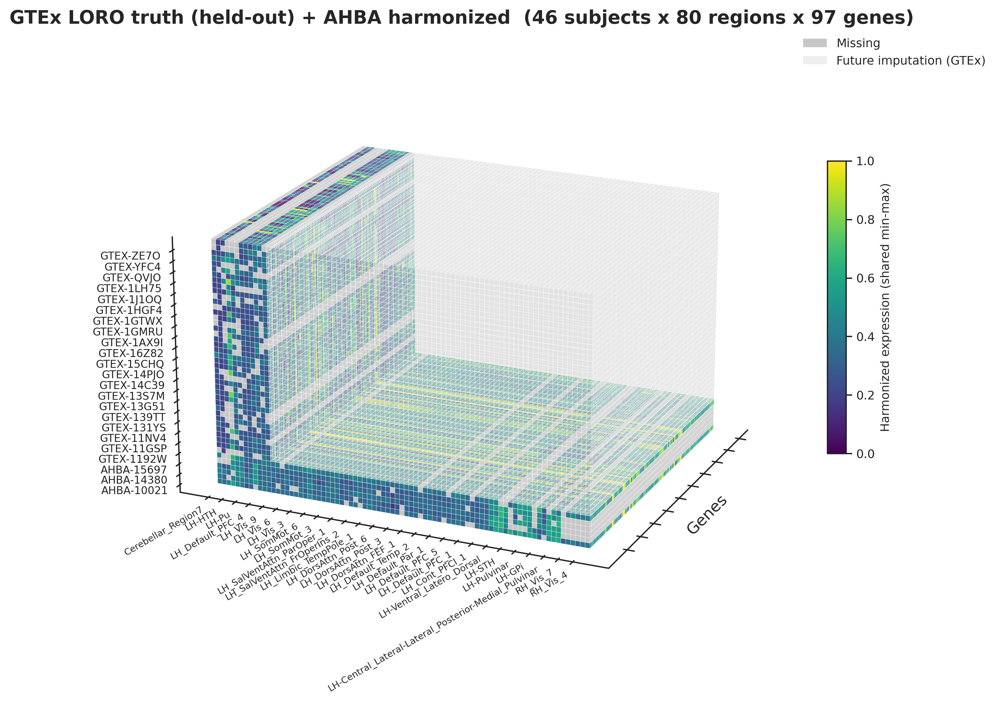

<Axes3D: title={'center': 'GTEx LORO truth (held-out) + AHBA harmonized  (46 subjects x 80 regions x 97 genes)'}, xlabel='Genes'>

In [6]:
render_joint('loro_truth')

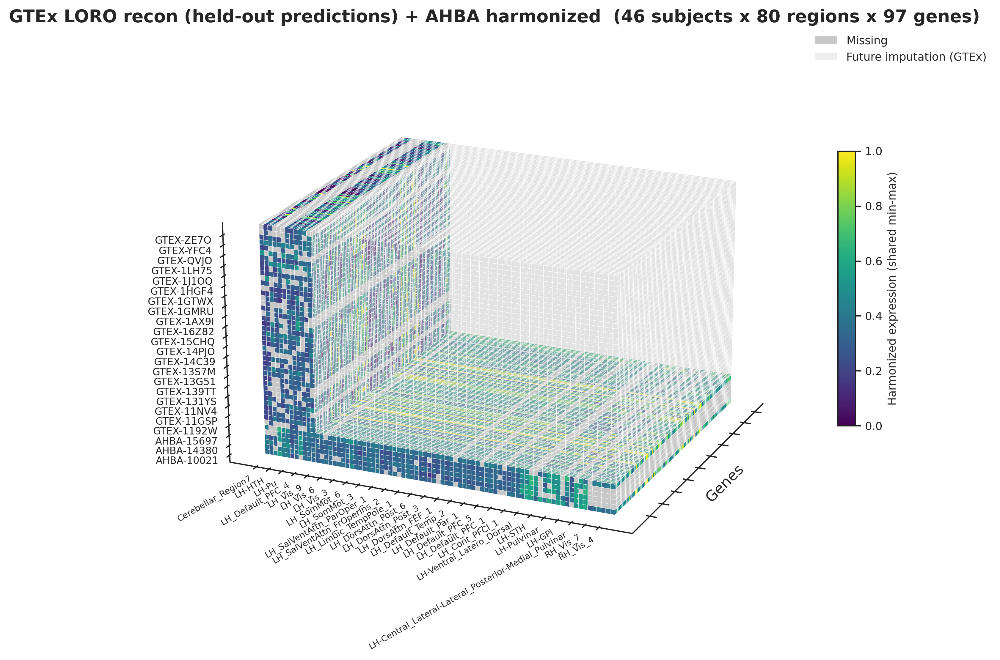

<Axes3D: title={'center': 'GTEx LORO recon (held-out predictions) + AHBA harmonized  (46 subjects x 80 regions x 97 genes)'}, xlabel='Genes'>

In [7]:
render_joint('loro_recon')

In [ ]:
render_joint('loro_fused')

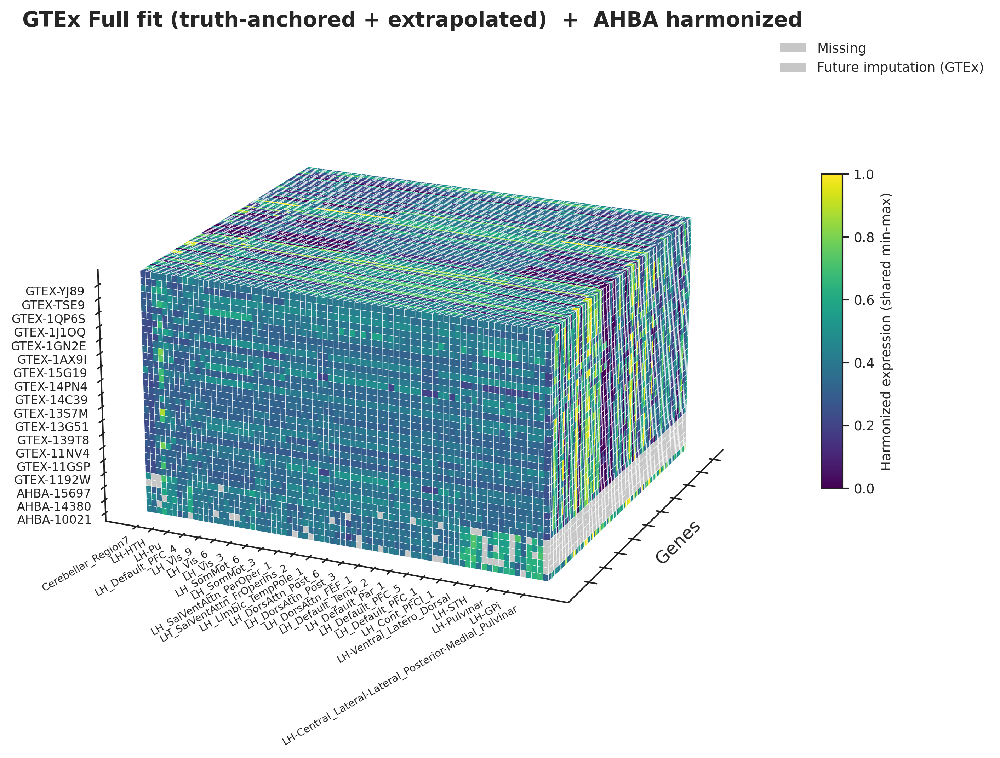

<Axes3D: title={'center': 'GTEx Full fit (truth-anchored + extrapolated)  +  AHBA harmonized'}, xlabel='Genes'>

In [ ]:
render_joint('fullfit')

## Standalone GTEx single-dataset renders

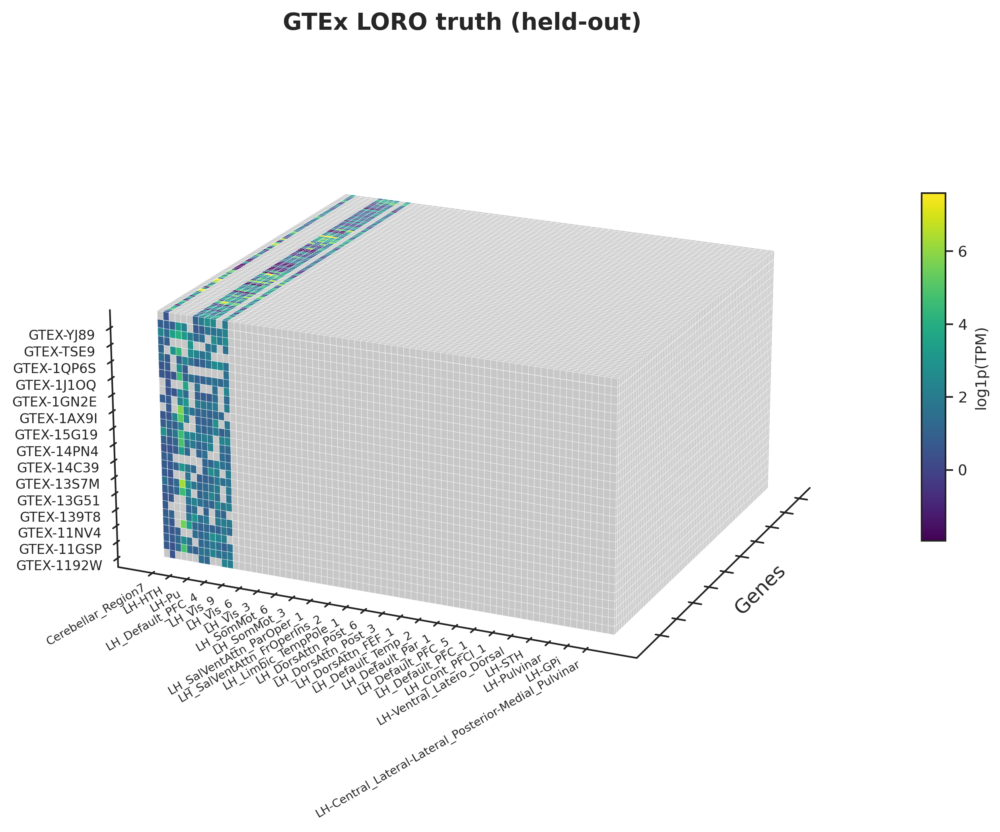

<Axes3D: title={'center': 'GTEx LORO truth (held-out)'}, xlabel='Genes'>

In [ ]:
render_standalone('loro_truth')

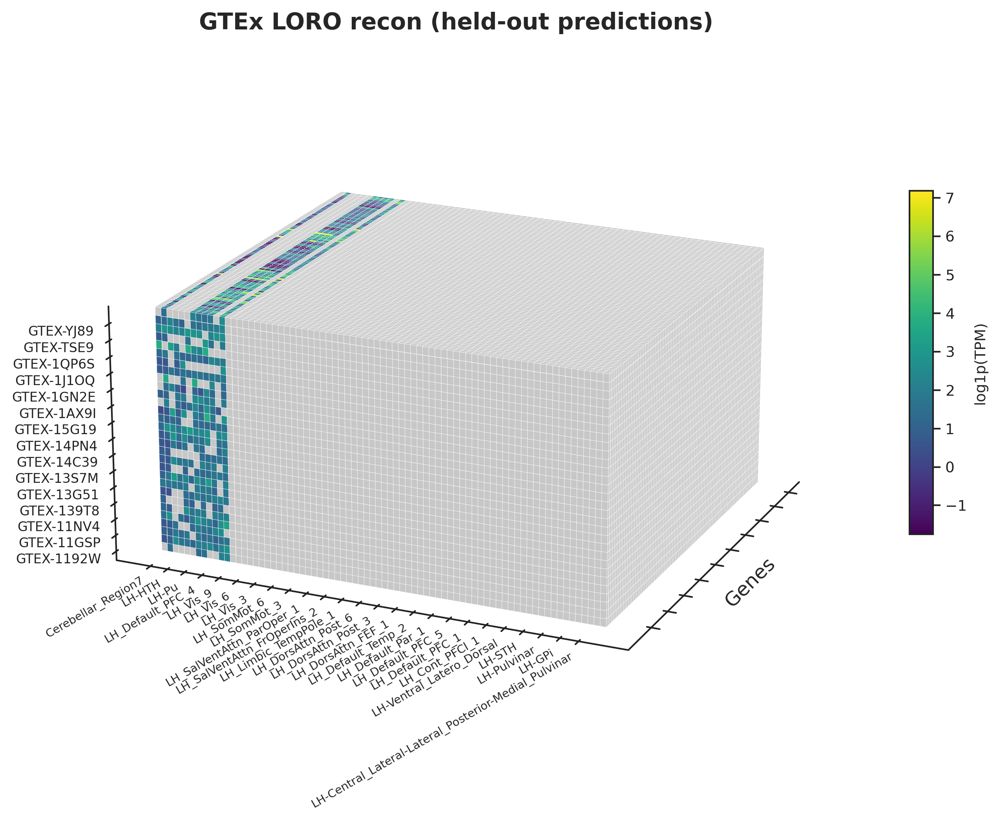

<Axes3D: title={'center': 'GTEx LORO recon (held-out predictions)'}, xlabel='Genes'>

In [ ]:
render_standalone('loro_recon')

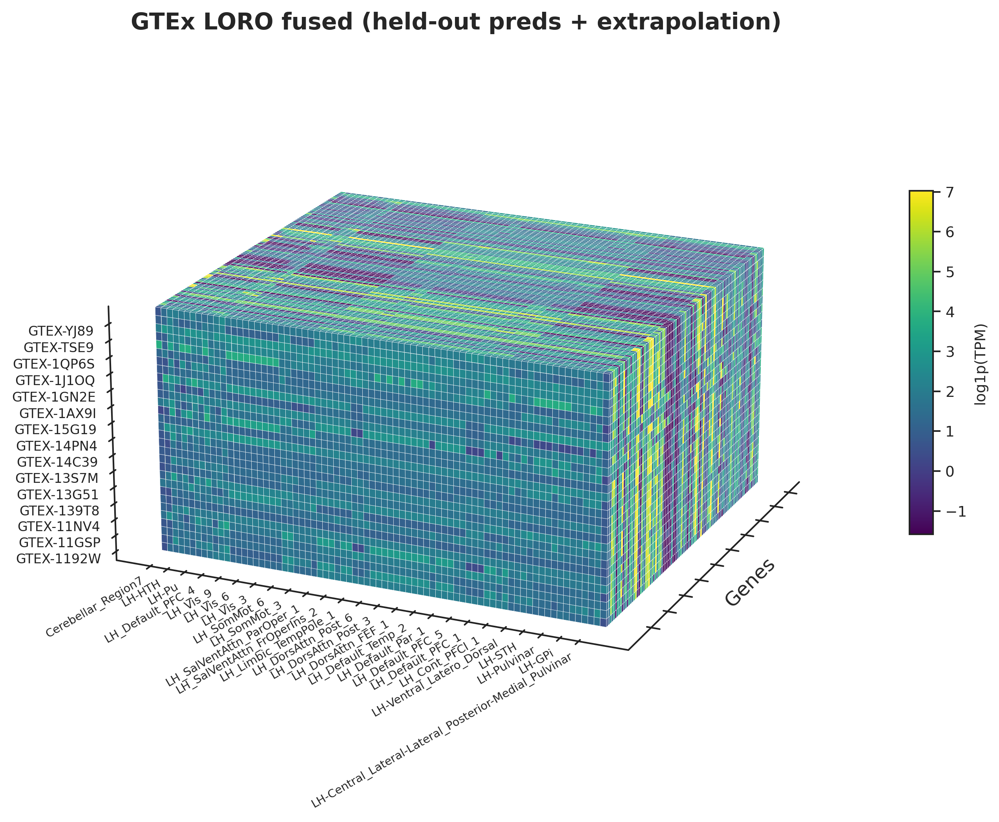

<Axes3D: title={'center': 'GTEx LORO fused (held-out preds + extrapolation)'}, xlabel='Genes'>

In [ ]:
render_standalone('loro_fused')

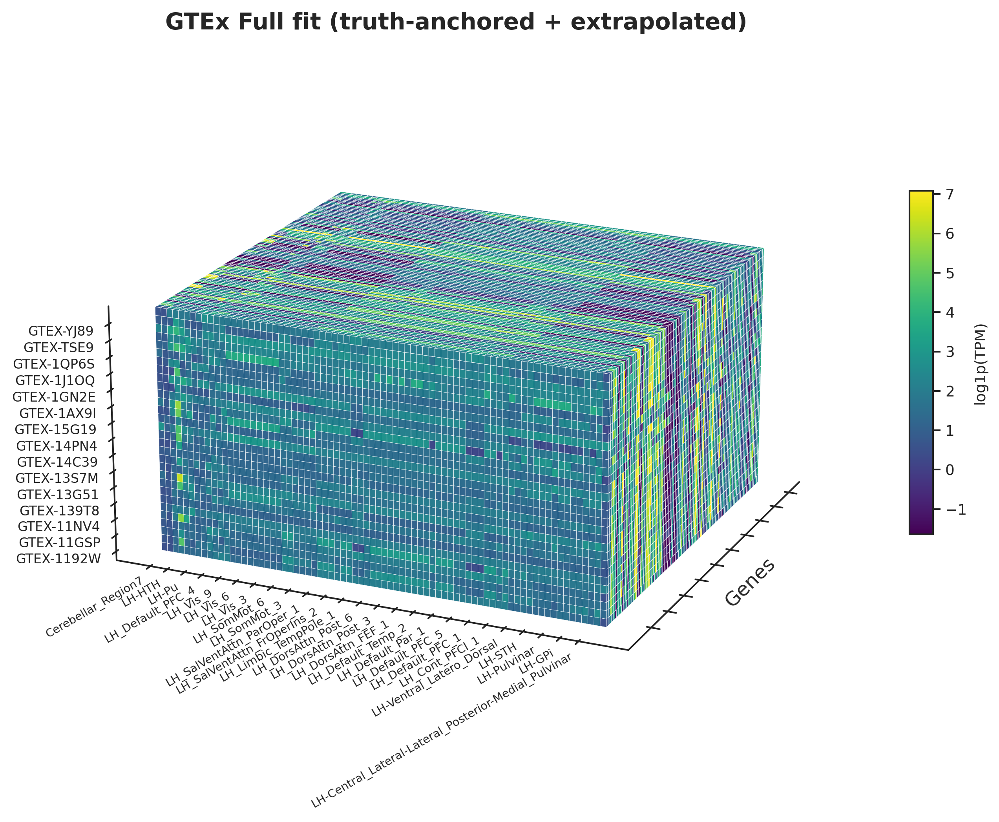

<Axes3D: title={'center': 'GTEx Full fit (truth-anchored + extrapolated)'}, xlabel='Genes'>

In [ ]:
render_standalone('fullfit')

## Notes

- All three GTEx stages and the AHBA reference share the same `matching` fingerprint by construction (`MatchingContext` is built once from `cfg`).
- `loro_truth` is sparse along the parcel axis (only the strictly-LORO-evaluated parcels carry truth); the rest renders as `Missing` gray. `loro_fused` and `fullfit` are dense; `loro_recon` is sparse like `loro_truth`.
- For `REGION_ORDERING='region_matched_superset'`, GTEx unmatched columns render translucent (`future_imputation_mask=True`) — same visual semantic as in `eval_gxp_samples.ipynb` and `eval_gxp_samples_combat.ipynb`.
- Switch `MODEL_NAME` between `'naive'`, `'dlam'`, `'plam'` to compare model families. Switch `REGION_ORDERING` to `'region_matched'` to drop the AHBA-only block and focus on the directly comparable 11 parcels.